# Methushelah's genes

Here, we will create a genetic algorthm to find great Methushelahs in Conway's Game of Life

First, we will decide the representation of the chromosomes.
Life consists of two optional states for each cell: Alive (1) and Dead (0),
which immediately cause us to think of binary representation for the grid f cells.
One approach will be to create a matrix of fixed size with the cells in binary representation.

In [1]:
import numpy as np
import random
#density - probability of each cell to be alive
Pd = [1./3,2./3]

#-----------------------------------------------
#here we will create the objects for chromosomes
class chromosome:
    def __init__(self,size):
        self.matrix = np.random.choice([1, 0], size=size, p=Pd)
        self.fitness = 0

    
    

In [2]:
#here we will have the function to create population
class population:
    def __init__(self,pop_size,chromo_size):
        self.members = [chromosome(chromo_size) for i in range(pop_size)]
    
    

The genetic operators we will have will be the _reproduction_ operator and the _mutation_ operator.

When _reproducing,_ two individuals from the population are chosen and are cut in a random point of the matrix to create an offspring of the pattern to this index of one parent combined with the rest from the other parent.

_Mutation_ will be defined as a single binary change in the initial configuration  

In [3]:
import random

#probability of mutaion:
Pm = 0.05
#probability of reproduction:
Pr = 1

#-----------------------------------------------

class population(population):
    def reproduction(self,parent1,parent2): #maybe move the selection inside this function
        if random.random() > Pr:
            return random.choice([parent1,parent2])

        size = parent1.matrix.shape
        if parent2.matrix.shape != size:
            raise ValueError('Parents shapes do not match.')
            
        offspring = chromosome(size)
        x,y = size

        #for easy slicing
        parent1.matrix.shape = (x*y)
        parent2.matrix.shape = (x*y)

        brk_pnt = np.random.choice(range(x*y))
        offspring.matrix = np.concatenate([parent1.matrix[:brk_pnt],parent2.matrix[brk_pnt:]])
        offspring.matrix.shape = size
        #are the 2 following necessary?
        parent1.matrix.shape = size
        parent2.matrix.shape = size
        
        self.add(random.choice([parent1,parent2]))
        return offspring

class chromosome(chromosome):
    def mutation(self):
        x,y = size = self.matrix.shape
        self.matrix.shape = (x*y)
        for i in range(x*y):
            if random.random() <= Pm:
                self.matrix[i] = 1-self.matrix[i]
        self.matrix.shape = size


In order to reproduce, we first need to _select_ the lucky parents!
We will use the roulette wheel selection for this.

In [4]:
class population(population):
    def select(self):
        total_fitness = sum([c.fitness for c in self.members])
        wheel_location = random.random() * total_fitness
        i = 0
        current_sum = self.members[i].fitness
        #print("cur_sum: ",current_sum)

        while ((current_sum < wheel_location) and (i < len(self.members))):
            i += 1
            current_sum += self.members[i].fitness
        selected = self.members[i]
        self.extract(selected)
        return selected

    def extract(self,chromo):
        self.members = [c for c in self.members if c!= chromo]
    
    def add(self,chromo):
        self.members += [chromo]



#### In order to select, we need to calculate the fitness of a chromosome.
This is the tricky part.

We want to give higher scores to configurations that are Methus, or close to ones.

Being a Methu is determined by the periodicity of the pattern at the end of the running.

For that, we will have to implement Life, run the configuration for a certain number of generations, and determine whether at some point the pattern repeats itself.

I have decided to run Life with a library called Seagull, only for simulating Life easily.

To determine periodicity we simply need to find a pattern that is identical to a pattern that was already shown,

That way, due to the determinism of CA, we will always get the same configurations following the identical patterns, meaning we've found periodicity.

So, when finding such a couple, we can say we have reached the lifespan (L) of the configuration.

For fitness I have decided to combine two tests:
 - the Lifespan of a configuration (L/I)
 - the peak population it had reached (P/I)
 
#### So the _fitness_ is the sum: L/I + P/I
The higher, the better.

In [5]:
from datetime import datetime
import pandas as pd


def clean(history):
    new_history = []
    for data in history:
        data = data[~np.all(data == 0, axis=1)]
        data = np.delete(data,np.where(~data.any(axis=0))[0], axis=1)
        new_history += [data]

    return new_history

In [6]:
# Some settings to show a JS animation
import matplotlib.pyplot as plt
from datetime import datetime

plt.rcParams["animation.html"] = "jshtml"

import seagull as sg
from seagull.lifeforms import Custom

ltc = 5
#size of the board
Sb = (200,200)
#number of iterations
In = 4000

#-----------------------------------------------

class chromosome(chromosome):
    def cal_fitness(self):
        start_event = (datetime.now())

        x,y = Sb
        xc,yc = self.matrix.shape
        
        board = sg.Board(size=(Sb))
        board.add(Custom(self.matrix), loc=(x//2-xc//2,y//2-yc//2))
        sim = sg.Simulator(board)
        stats = sim.run(sg.rules.conway_classic, iters=In)
        history = sim.get_history().astype(int)
        history = clean(history)
        g = 0
        lifespan = 0
        found = False

        for gen in history:
            if g == 0:
                g+=1
                continue

            ite = history[g-1:g-ltc:-1] if g > ltc else history[g-1::-1]
            for prev in ite:
                comp = gen == prev
                if type(comp) != bool: #if it's bool, then sizes don't match and datas not same.
                    if comp.all():
                        lifespan = g
                        found = True
                        break
            if found:
                break
            g+=1
        self.matrix.shape = (xc*yc)
        self.I = I = sum(self.matrix)
        self.matrix.shape = (xc,yc)
        self.L = L = lifespan
#         history[L].shape = (x*y)
#         F = sum(history[L])
#         history[L].shape = (x,y)
        self.P = P = stats["peak_cell_coverage"] * x*y #that's the pop size at its highest
        
        self.fitness = L/I + P/I if (L > 0) else 0
        if L == 0 and self.fitness != 0:
            print("problem")
        end_event = (datetime.now())
        self.cal_time = end_event-start_event
        self.cal_time = self.cal_time.seconds+self.cal_time.microseconds/1000000


### Now, we can run the evolution algorithm itself!

In [7]:
import copy

even = False
pop_size = 10
chromo_size = (6,6)
pop = population(pop_size,chromo_size)
fit_rise = []
fit_max_rise = []
maxes_config = []
for c in pop.members:
    c.cal_fitness()

old_fit_avg = sum([c.fitness for c in pop.members])/len(pop.members)
old_fit_max = max([c.fitness for c in pop.members])
avg_time = sum([c.cal_time for c in pop.members])/len(pop.members)
print(avg_time)
print("old pop: ",[c.fitness for c in pop.members])
print("avg: ",old_fit_avg)
fit_rise += [old_fit_avg]
fit_max_rise += [old_fit_max]
for c in pop.members:
    if c.fitness == old_fit_max:
        maxes_config += [copy.deepcopy(c)]
        break
    
for p in range(100):
    print("generation: ",p+1)
    print("-------------------")
    
    new_pop = population(0,0)
    m = 0
    for c in pop.members:
        if c.fitness > m:
            m = c.fitness
            mc = c
    new_pop.add(mc)
#     mmc = copy.deepcopy(mc)
#     mmc.mutation()
#     new_pop.add(mmc)
    while len(pop.members) >= 2 :
        p1 = pop.select()
        p2 = pop.select()
        os = pop.reproduction(p1,p2)
        if os: 
            os.mutation()
            if len(new_pop.members) < pop_size:
                new_pop.add(os)
    if len(pop.members) > 0 and len(new_pop.members) < pop_size:
        for os in pop.members:
            new_pop.add(os)
    for c in new_pop.members:
        c.cal_fitness()

    fit_avg = sum([c.fitness for c in new_pop.members])/len(new_pop.members)
    fit_max = max([c.fitness for c in new_pop.members])
    print("new pop: ",[c.fitness for c in new_pop.members])
    print("avg: ",fit_avg)
    print("max: ",fit_max)
    fit_rise += [fit_avg]
    fit_max_rise += [fit_max]
    avg_time = sum([c.cal_time for c in new_pop.members])/len(new_pop.members)
    print(avg_time)
    for c in new_pop.members:
        if c.fitness == fit_max:
            maxes_config += [copy.deepcopy(c)]
            break
    if fit_rise[-1] == fit_rise[-2]:
        even = True
        break
    
    
    pop = new_pop


2021-12-22 23:45:48.772 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
C:\Users\mimis\Anaconda3\lib\site-packages\seagull\utils\statistics.py:23: RuntimeWarning: divide by zero encountered in log2
  return -np.sum(np.log2([zero_probs, one_probs]))
C:\Users\mimis\Anaconda3\lib\site-packages\ipykernel_launcher.py:42: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
2021-12-22 23:46:01.607 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:46:14.779 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:46:27.462 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:46:40.199 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:46:52.990 | INFO     | seagull.simulator:compute_statistics:128 - Computin

12.7138721
old pop:  [1.2, 107.07142857142857, 4.846153846153846, 1.3333333333333333, 108.6, 1.4615384615384617, 1.2727272727272727, 4.277777777777778, 3.8, 24.142857142857142]
avg:  25.80058164058164
generation:  1
-------------------


2021-12-22 23:47:56.600 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:48:09.348 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:48:22.506 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:48:35.458 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:48:48.690 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:49:01.503 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:49:14.175 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:49:35.600 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:49:49.417 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [108.6, 1.2857142857142856, 98.72727272727272, 1.5714285714285712, 3.5, 21.3125, 2.6153846153846154, 5.0, 1.5, 14.266666666666667]
avg:  25.837896686646683
max:  108.6
13.842840800000001
generation:  2
-------------------


2021-12-22 23:50:15.019 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:50:27.934 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:50:40.765 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:50:53.557 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:51:06.482 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:51:20.282 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:51:33.198 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:51:46.006 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:51:58.806 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [108.6, 17.357142857142858, 4.333333333333333, 24.53333333333333, 13.583333333333334, 5.928571428571428, 2.5625, 12.375, 6.0, 3.7142857142857144]
avg:  19.89875
max:  108.6
12.891159100000001
generation:  3
-------------------


2021-12-22 23:52:24.267 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:52:37.240 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:52:50.039 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:53:03.370 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:53:16.248 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:53:29.110 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:53:42.051 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:53:54.854 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:54:07.593 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [108.6, 4.428571428571429, 202.5, 83.5, 16.454545454545453, 20.733333333333334, 40.3, 3.2142857142857144, 2.6153846153846154, 26.53333333333333]
avg:  50.887945387945386
max:  202.5
12.8457642
generation:  4
-------------------


2021-12-22 23:54:33.100 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:54:46.122 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:54:58.949 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:55:11.689 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:55:25.509 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:55:38.302 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:55:51.064 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:56:04.017 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:56:16.860 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [202.5, 5.071428571428571, 2.2142857142857144, 6.3999999999999995, 34.733333333333334, 7.533333333333333, 2.1176470588235294, 2.0, 109.92307692307692, 36.38461538461539]
avg:  40.88777203188969
max:  202.5
12.910290700000001
generation:  5
-------------------


2021-12-22 23:56:42.494 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:56:55.504 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:57:08.191 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:57:21.008 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:57:33.821 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:57:46.524 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:57:59.363 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:58:12.063 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:58:24.831 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [202.5, 4.714285714285714, 2.88235294117647, 23.36842105263158, 5.25, 18.27777777777778, 4.266666666666667, 10.375, 3.3157894736842106, 9.058823529411764]
avg:  28.40091171556342
max:  202.5
12.753526500000001
generation:  6
-------------------


2021-12-22 23:58:50.265 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:59:03.308 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:59:16.063 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:59:28.838 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:59:41.508 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-22 23:59:54.329 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:00:09.336 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:00:24.161 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:00:39.020 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [202.5, 26.294117647058826, 2.8125, 2.5, 59.5625, 6.25, 12.411764705882353, 2.25, 149.0, 9.368421052631579]
avg:  47.29493034055728
max:  202.5
13.452943099999999
generation:  7
-------------------


2021-12-23 00:01:05.223 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:01:18.537 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:01:32.218 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:01:47.176 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:02:02.528 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:02:15.935 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:02:28.755 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:02:41.733 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:02:54.558 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [202.5, 78.29411764705881, 1.7647058823529411, 14.8125, 1.7894736842105263, 2.888888888888889, 33.05882352941176, 2.95, 31.705882352941178, 32.875]
avg:  40.263939198486405
max:  202.5
13.4744788
generation:  8
-------------------


2021-12-23 00:03:20.383 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:03:33.553 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:03:46.259 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:03:59.106 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:04:12.042 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:04:24.844 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:04:37.820 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:04:50.611 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:05:03.346 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [202.5, 3.6315789473684212, 3.6111111111111107, 43.53333333333333, 1.357142857142857, 3.2, 18.0, 1.380952380952381, 2.9, 17.95]
avg:  29.806411862990807
max:  202.5
12.875967399999999
generation:  9
-------------------


2021-12-23 00:05:29.613 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:05:42.966 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:05:55.695 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:06:08.665 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:06:21.434 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:06:34.388 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:06:47.764 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:07:00.542 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:07:13.372 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [202.5, 4.944444444444444, 6.75, 3.6470588235294112, 1.6315789473684212, 2.333333333333333, 3.0588235294117645, 4.333333333333334, 2.8125, 41.11764705882353]
avg:  27.312871947024426
max:  202.5
12.972198299999999
generation:  10
-------------------


2021-12-23 00:07:39.329 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:07:52.832 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:08:05.685 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:08:18.657 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:08:31.439 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:08:44.373 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:08:57.202 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:09:10.201 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:09:23.186 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [202.5, 20.45, 68.77777777777777, 1.8823529411764706, 6.611111111111111, 3.6470588235294112, 44.388888888888886, 37.05882352941177, 1.5, 4.85]
avg:  39.16660130718954
max:  202.5
12.9589327
generation:  11
-------------------


2021-12-23 00:09:49.268 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:10:02.397 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:10:15.259 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:10:27.960 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:10:40.779 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:10:53.475 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:11:07.174 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:11:20.091 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:11:32.990 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [202.5, 6.105263157894736, 2.0, 4.2105263157894735, 2.5, 2.0, 2.5, 44.388888888888886, 21.77777777777778, 0]
avg:  28.798245614035086
max:  202.5
12.948401099999998
generation:  12
-------------------


2021-12-23 00:11:58.908 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:12:11.980 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:12:24.739 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:12:37.471 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:12:50.324 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:13:03.258 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:13:16.063 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:13:28.867 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:13:41.679 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [202.5, 37.0, 36.82352941176471, 4.0, 1.8947368421052633, 2.7, 2.5, 1.8235294117647058, 43.8235294117647, 1.25]
avg:  33.43153250773993
max:  202.5
12.821626
generation:  13
-------------------


2021-12-23 00:14:07.440 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:14:20.617 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:14:33.508 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:14:46.432 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:14:59.184 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:15:12.009 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:15:24.912 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:15:37.696 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:15:50.404 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [202.5, 84.33333333333333, 23.42105263157895, 2.4117647058823533, 9.833333333333332, 37.888888888888886, 25.166666666666664, 3.9375, 2.8, 3.9999999999999996]
avg:  39.62925395596835
max:  202.5
12.881490600000001
generation:  14
-------------------


2021-12-23 00:16:16.507 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:16:29.619 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:16:42.366 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:16:55.191 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:17:08.073 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:17:20.991 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:17:34.496 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:17:47.435 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:18:00.869 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [202.5, 2.0555555555555554, 14.428571428571427, 77.1, 2.2631578947368425, 8.095238095238095, 8.055555555555555, 85.27777777777777, 21.27777777777778, 1.8421052631578947]
avg:  42.28957393483709
max:  202.5
12.9821469
generation:  15
-------------------


2021-12-23 00:18:26.682 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:18:39.853 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:18:52.739 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:19:05.556 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:19:18.538 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:19:31.440 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:19:44.375 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:19:57.333 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:20:10.225 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [202.5, 59.5625, 4.315789473684211, 1.434782608695652, 3.6842105263157894, 17.095238095238095, 21.666666666666664, 2.526315789473684, 5.047619047619048, 94.5625]
avg:  41.239562220769315
max:  202.5
12.9169625
generation:  16
-------------------


2021-12-23 00:20:36.080 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:20:49.188 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:21:02.599 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:21:15.569 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:21:29.111 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:21:42.439 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:21:56.216 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:22:09.467 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:22:22.333 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [202.5, 184.0, 2.466666666666667, 1.9523809523809523, 2.5294117647058822, 1.4, 1.8095238095238093, 26.4, 11.40909090909091, 12.263157894736842]
avg:  44.6730231997105
max:  202.5
13.161833999999999
generation:  17
-------------------


2021-12-23 00:22:47.980 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:23:01.243 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:23:14.081 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:23:26.892 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:23:39.745 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:23:52.492 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:24:05.424 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:24:18.191 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:24:31.053 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [202.5, 4.75, 2.894736842105263, 17.5, 13.681818181818183, 32.9, 2.0, 3.0, 1.9375, 5.315789473684211]
avg:  28.647984449760763
max:  202.5
12.838636
generation:  18
-------------------


2021-12-23 00:24:56.549 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:25:09.750 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:25:22.700 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:25:35.506 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:25:48.273 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:26:01.927 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:26:15.099 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:26:27.903 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:26:40.670 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [202.5, 35.81818181818182, 3.2222222222222223, 2.4210526315789473, 231.0909090909091, 20.526315789473685, 1.75, 2.1904761904761907, 3.2105263157894735, 5.0]
avg:  50.77296840586315
max:  231.0909090909091
12.951770200000002
generation:  19
-------------------


2021-12-23 00:27:06.379 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:27:19.870 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:27:32.601 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:27:45.523 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:27:58.506 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:28:11.350 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:28:24.057 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:28:36.803 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:28:49.962 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [231.0909090909091, 8.55, 37.333333333333336, 24.0, 38.666666666666664, 5.055555555555555, 2.1, 14.736842105263158, 5.631578947368421, 31.411764705882355]
avg:  39.85766504049787
max:  231.0909090909091
12.897532600000002
generation:  20
-------------------


2021-12-23 00:29:15.626 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:29:29.290 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:29:42.361 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:29:55.772 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:30:08.565 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:30:21.380 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:30:34.183 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:30:46.934 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:30:59.741 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [231.0909090909091, 37.38095238095238, 36.11764705882353, 2.5555555555555554, 1.894736842105263, 2.4117647058823524, 8.55, 2.8421052631578947, 7.7368421052631575, 2.0]
avg:  33.25805130026493
max:  231.0909090909091
13.0534771
generation:  21
-------------------


2021-12-23 00:31:27.163 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:31:40.634 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:31:54.594 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:32:07.507 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:32:20.756 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:32:33.469 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:32:46.367 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:32:59.846 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:33:12.593 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [231.0909090909091, 0, 17.764705882352942, 2.5238095238095237, 3.8421052631578947, 15.736842105263158, 14.5, 2.7, 3.1111111111111107, 23.3125]
avg:  31.458198297660367
max:  231.0909090909091
13.1722671
generation:  22
-------------------


2021-12-23 00:33:38.677 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:33:52.588 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:34:06.571 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:34:19.410 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:34:32.840 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:34:45.611 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:34:58.518 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:35:11.356 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:35:24.359 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [231.0909090909091, 1.9999999999999998, 9.105263157894736, 169.25, 8.263157894736842, 2.0555555555555554, 4.428571428571429, 2.5, 2.05, 1.5]
avg:  43.22434571276676
max:  231.0909090909091
13.112640800000003
generation:  23
-------------------


2021-12-23 00:35:49.993 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:36:03.810 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:36:16.717 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:36:29.572 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:36:42.454 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:36:55.324 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:37:08.149 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:37:21.033 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:37:34.292 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [231.0909090909091, 2.1176470588235294, 5.647058823529411, 9.263157894736842, 2.7777777777777777, 1.1578947368421053, 3.2777777777777777, 143.77777777777777, 31.647058823529413, 15.15]
avg:  44.59070597617037
max:  231.0909090909091
12.986615599999999
generation:  24
-------------------


2021-12-23 00:38:00.399 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:38:14.168 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:38:26.894 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:38:39.636 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:38:52.500 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:39:05.351 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:39:18.121 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:39:30.980 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:39:43.849 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [231.0909090909091, 1.727272727272727, 2.2941176470588234, 63.69230769230769, 8.625, 13.0, 2.35, 48.375, 3.125, 11.722222222222223]
avg:  38.60018293797706
max:  231.0909090909091
12.915919299999999
generation:  25
-------------------


2021-12-23 00:40:09.592 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:40:23.026 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:40:35.819 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:40:48.685 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:41:01.548 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:41:14.619 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:41:27.966 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:41:40.878 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:41:53.622 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [231.0909090909091, 28.863636363636363, 4.4375, 3.1538461538461537, 9.571428571428571, 1.8666666666666667, 2.375, 4.611111111111111, 12.352941176470589, 2.0500000000000003]
avg:  30.037303913406852
max:  231.0909090909091
12.9608961
generation:  26
-------------------


2021-12-23 00:42:19.409 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:42:32.890 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:42:45.662 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:42:58.780 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:43:11.556 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:43:24.512 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:43:37.397 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:43:50.293 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:44:03.130 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [231.0909090909091, 2.7727272727272725, 5.75, 13.142857142857142, 48.25, 2.8125, 83.33333333333334, 1.65, 2.083333333333333, 5.214285714285714]
avg:  39.609994588744584
max:  231.0909090909091
12.894784199999998
generation:  27
-------------------


2021-12-23 00:44:28.652 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:44:42.106 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:44:55.003 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:45:07.689 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:45:20.636 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:45:33.401 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:45:46.165 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:45:58.824 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:46:11.914 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [231.0909090909091, 64.9, 1.875, 3.466666666666667, 7.277777777777779, 15.538461538461538, 1.5, 27.6875, 10.538461538461538, 75.2]
avg:  43.90747766122766
max:  231.0909090909091
12.879661000000002
generation:  28
-------------------


2021-12-23 00:46:37.798 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:46:51.183 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:47:03.902 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:47:16.676 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:47:29.663 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:47:42.478 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:47:55.231 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:48:08.035 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:48:20.749 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [231.0909090909091, 12.866666666666667, 8.043478260869566, 4.055555555555555, 5.800000000000001, 4.4375, 1.6, 3.0588235294117645, 1.9333333333333331, 1.5882352941176472]
avg:  27.447450173086366
max:  231.0909090909091
12.8394958
generation:  29
-------------------


2021-12-23 00:48:46.576 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:49:00.029 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:49:13.279 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:49:26.200 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:49:38.977 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:49:51.840 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:50:04.736 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:50:17.589 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:50:30.392 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [231.0909090909091, 218.77777777777777, 8.692307692307692, 5.0, 6.2631578947368425, 88.35294117647058, 1.6521739130434783, 16.263157894736842, 1.6111111111111112, 16.77777777777778]
avg:  59.44813143288712
max:  231.0909090909091
12.9219965
generation:  30
-------------------


2021-12-23 00:50:55.920 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:51:10.193 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:51:23.441 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:51:36.239 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:51:49.106 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:52:01.845 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:52:14.605 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:52:27.314 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:52:40.154 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [231.0909090909091, 27.71428571428571, 3.9999999999999996, 3.388888888888889, 2.090909090909091, 5.0, 2.166666666666667, 16.2, 11.875, 22.125]
avg:  32.565165945165944
max:  231.0909090909091
12.9387157
generation:  31
-------------------


2021-12-23 00:53:05.688 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:53:19.127 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:53:32.704 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:53:45.521 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:53:58.268 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:54:10.980 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:54:23.707 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:54:36.963 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:54:50.123 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [231.0909090909091, 231.0909090909091, 29.25, 5.523809523809524, 1.5, 7.714285714285714, 2.0, 2.4705882352941178, 2.4, 1.4736842105263157]
avg:  51.45141858657339
max:  231.0909090909091
12.966371200000001
generation:  32
-------------------


2021-12-23 00:55:15.676 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:55:29.213 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:55:41.943 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:55:54.673 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:56:07.732 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:56:20.735 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:56:33.676 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:56:46.478 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:56:59.191 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [231.0909090909091, 9.863636363636363, 17.210526315789473, 2.45, 33.04545454545455, 73.0952380952381, 5.833333333333333, 2.15, 7.45, 51.34782608695652]
avg:  43.35369238313174
max:  231.0909090909091
12.881467500000003
generation:  33
-------------------


2021-12-23 00:57:24.824 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:57:38.400 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:57:51.216 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:58:03.923 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:58:16.792 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:58:29.741 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:58:42.896 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:58:55.841 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:59:08.743 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [231.0909090909091, 2.1818181818181817, 4.25, 2.0, 116.90476190476191, 3.1764705882352944, 109.72222222222221, 1.7222222222222223, 4.19047619047619, 11.285714285714286]
avg:  48.65245946863594
max:  231.0909090909091
13.0273329
generation:  34
-------------------


2021-12-23 00:59:35.342 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 00:59:48.908 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:00:01.653 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:00:15.047 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:00:27.927 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:00:40.683 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:00:53.555 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:01:06.627 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:01:19.727 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [231.0909090909091, 5.4375, 231.0909090909091, 1.2307692307692308, 1.894736842105263, 14.61904761904762, 2.45, 41.22222222222222, 17.157894736842106, 3.6]
avg:  54.97939888328047
max:  231.0909090909091
13.0011986
generation:  35
-------------------


2021-12-23 01:01:45.734 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:01:59.211 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:02:11.966 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:02:24.965 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:02:37.994 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:02:50.795 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:03:03.989 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:03:17.099 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:03:30.489 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [231.0909090909091, 17.0, 16.294117647058826, 39.388888888888886, 10.588235294117647, 1.5263157894736843, 169.52631578947367, 5.7894736842105265, 5.888888888888889, 1.25]
avg:  49.834314507302125
max:  231.0909090909091
13.0146871
generation:  36
-------------------


2021-12-23 01:03:56.204 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:04:09.588 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:04:22.440 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:04:36.432 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:04:49.275 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:05:02.107 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:05:14.940 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:05:27.895 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:05:40.726 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [231.0909090909091, 22.166666666666668, 3.25, 21.72222222222222, 2.590909090909091, 4.6, 5.444444444444445, 3.1052631578947367, 4.8125, 1.9411764705882355]
avg:  30.07240911436345
max:  231.0909090909091
12.9963302
generation:  37
-------------------


2021-12-23 01:06:06.862 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:06:21.443 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:06:34.323 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:06:47.155 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:07:00.066 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:07:12.810 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:07:25.856 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:07:38.860 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:07:51.728 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [231.0909090909091, 27.71428571428571, 2.5555555555555554, 79.58823529411765, 1.8, 22.166666666666668, 16.71428571428571, 1.6428571428571428, 68.81818181818181, 2.4444444444444446]
avg:  45.45354214413039
max:  231.0909090909091
13.0972261
generation:  38
-------------------


2021-12-23 01:08:17.851 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:08:31.374 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:08:44.140 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:08:56.907 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:09:09.785 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:09:22.687 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:09:35.488 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:09:48.288 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:10:01.123 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [231.0909090909091, 2.8095238095238093, 6.2, 2.4444444444444446, 4.823529411764706, 4.904761904761905, 28.11111111111111, 3.904761904761905, 6.842105263157895, 3.75]
avg:  29.488114694043485
max:  231.0909090909091
12.8710208
generation:  39
-------------------


2021-12-23 01:10:26.982 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:10:40.428 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:10:53.351 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:11:06.761 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:11:19.781 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:11:32.684 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:11:45.739 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:11:59.204 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:12:11.986 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [231.0909090909091, 33.631578947368425, 3.941176470588235, 8.473684210526315, 17.421052631578945, 4.333333333333333, 20.444444444444443, 4.117647058823529, 2.9473684210526314, 4.0]
avg:  33.0401194608625
max:  231.0909090909091
13.0510894
generation:  40
-------------------


2021-12-23 01:12:37.612 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:12:50.979 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:13:03.960 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:13:16.705 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:13:29.777 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:13:42.585 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:13:55.321 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:14:08.288 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:14:20.989 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [231.0909090909091, 33.75, 2.473684210526316, 4.181818181818182, 2.0588235294117645, 3.5294117647058822, 91.11764705882354, 2.9444444444444446, 2.0666666666666664, 271.2631578947369]
avg:  64.44765628420427
max:  271.2631578947369
12.924591000000001
generation:  41
-------------------


2021-12-23 01:14:47.191 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:15:00.591 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:15:13.419 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:15:26.401 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:15:39.151 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:15:52.182 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:16:05.229 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:16:18.022 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:16:30.913 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [271.2631578947369, 2.0, 4.055555555555555, 1.4210526315789473, 3.909090909090909, 4.7368421052631575, 2.125, 1.3333333333333333, 20.6, 3.5294117647058822]
avg:  31.49734441942647
max:  271.2631578947369
12.9366075
generation:  42
-------------------


2021-12-23 01:16:56.819 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:17:10.225 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:17:23.152 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:17:35.992 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:17:48.789 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:18:02.103 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:18:16.055 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:18:29.636 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:18:42.554 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [271.2631578947369, 1.5652173913043477, 10.947368421052632, 5.526315789473684, 9.722222222222221, 11.411764705882353, 1.9375, 7.555555555555555, 3.65, 23.8125]
avg:  34.73916019802277
max:  271.2631578947369
13.111383800000002
generation:  43
-------------------


2021-12-23 01:19:08.397 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:19:21.946 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:19:34.831 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:19:47.720 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:20:00.587 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:20:13.346 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:20:26.083 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:20:39.003 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:20:51.767 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [271.2631578947369, 72.83333333333334, 15.315789473684209, 17.0, 8.470588235294118, 7.1875, 81.19047619047619, 17.352941176470587, 18.09090909090909, 5.0]
avg:  51.37046953949046
max:  271.2631578947369
12.9298702
generation:  44
-------------------


2021-12-23 01:21:17.753 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:21:31.284 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:21:44.121 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:21:56.877 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:22:09.769 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:22:22.558 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:22:35.742 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:22:48.602 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:23:01.374 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [271.2631578947369, 43.72222222222223, 11.176470588235293, 1.6842105263157894, 15.0, 2.3636363636363638, 5.388888888888889, 3.1764705882352944, 3.2222222222222223, 13.0]
avg:  36.9997279294493
max:  271.2631578947369
12.890324700000003
generation:  45
-------------------


2021-12-23 01:23:27.066 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:23:40.465 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:23:53.303 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:24:06.137 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:24:18.930 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:24:31.800 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:24:44.667 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:24:57.471 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:25:10.395 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [271.2631578947369, 2.526315789473684, 39.111111111111114, 1.5625, 5.388888888888889, 30.125, 3.1176470588235294, 46.35, 2.5, 4.761904761904762]
avg:  40.6706525504939
max:  271.2631578947369
12.8819227
generation:  46
-------------------


2021-12-23 01:25:36.097 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:25:49.497 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:26:02.334 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:26:15.420 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:26:28.219 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:26:40.957 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:26:53.752 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:27:06.615 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:27:21.029 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [271.2631578947369, 3.764705882352941, 3.75, 2.105263157894737, 6.411764705882353, 7.333333333333334, 1.85, 3.7222222222222223, 3.533333333333333, 2.7222222222222223]
avg:  30.645600275197808
max:  271.2631578947369
13.0299859
generation:  47
-------------------


2021-12-23 01:27:46.694 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:28:00.269 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:28:13.052 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:28:25.827 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:28:38.649 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:28:51.419 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:29:04.216 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:29:16.986 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:29:29.886 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [271.2631578947369, 18.333333333333332, 2.2857142857142856, 23.352941176470587, 1.736842105263158, 6.411764705882353, 2.588235294117647, 2.105263157894737, 1.45, 9.095238095238095]
avg:  33.862249004865106
max:  271.2631578947369
12.8602561
generation:  48
-------------------


2021-12-23 01:29:55.575 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:30:09.371 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:30:22.271 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:30:34.988 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:30:47.736 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:31:00.593 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:31:14.235 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:31:27.056 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:31:39.800 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [271.2631578947369, 31.058823529411764, 1.4285714285714286, 1.619047619047619, 7.25, 22.823529411764707, 1.4761904761904763, 1.4210526315789473, 2.2941176470588234, 5.277777777777778]
avg:  34.591226841613846
max:  271.2631578947369
12.955190299999998
generation:  49
-------------------


2021-12-23 01:32:05.342 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:32:18.771 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:32:31.799 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:32:44.595 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:32:57.832 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:33:10.894 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:33:23.862 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:33:36.725 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:33:49.514 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [271.2631578947369, 135.66666666666666, 12.529411764705884, 8.05, 13.565217391304348, 1.3333333333333333, 5.777777777777778, 5.727272727272727, 1.3333333333333333, 2.5]
avg:  45.77461708891309
max:  271.2631578947369
12.9383781
generation:  50
-------------------


2021-12-23 01:34:15.554 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:34:28.983 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:34:41.808 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:34:54.658 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:35:07.445 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:35:20.258 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:35:33.050 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:35:45.842 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:35:58.643 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [271.2631578947369, 8.61111111111111, 22.526315789473685, 22.0, 1.3181818181818181, 1.7777777777777777, 1.8947368421052633, 1.55, 1.3181818181818181, 1.3181818181818181]
avg:  33.357764486975015
max:  271.2631578947369
12.901353300000002
generation:  51
-------------------


2021-12-23 01:36:24.347 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:36:37.844 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:36:50.689 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:37:04.399 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:37:17.175 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:37:30.082 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:37:43.130 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:37:55.923 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:38:09.082 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [271.2631578947369, 16.666666666666668, 271.2631578947369, 1.8421052631578947, 1.4705882352941178, 5.473684210526316, 1.368421052631579, 33.5625, 3.1904761904761902, 7.0]
avg:  61.31007574082266
max:  271.2631578947369
13.014778699999999
generation:  52
-------------------


2021-12-23 01:38:34.829 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:38:48.247 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:39:01.101 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:39:13.906 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:39:26.851 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:39:39.973 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:39:54.172 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:40:07.143 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:40:19.875 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [271.2631578947369, 26.944444444444443, 16.666666666666668, 16.666666666666668, 2.0555555555555554, 4.6190476190476195, 96.61111111111111, 7.15, 21.789473684210527, 1.3333333333333333]
avg:  46.50994569757727
max:  271.2631578947369
13.0425923
generation:  53
-------------------


2021-12-23 01:40:46.041 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:41:01.516 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:41:14.871 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:41:28.581 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:41:42.474 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:41:55.349 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:42:08.237 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:42:21.080 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:42:34.048 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [271.2631578947369, 44.0, 2.1500000000000004, 18.5, 10.238095238095237, 2.0476190476190474, 2.4210526315789473, 4.142857142857142, 3.2, 7.157894736842105]
avg:  36.512067669172936
max:  271.2631578947369
13.4131869
generation:  54
-------------------


2021-12-23 01:43:00.186 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:43:13.720 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:43:26.685 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:43:39.543 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:43:52.372 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:44:05.197 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:44:18.054 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:44:31.210 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:44:44.367 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [271.2631578947369, 1.35, 2.2222222222222223, 1.875, 1.8823529411764706, 7.157894736842105, 143.6875, 175.84210526315792, 26.5, 1.75]
avg:  63.35302330581355
max:  271.2631578947369
12.9806557
generation:  55
-------------------


2021-12-23 01:45:11.219 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:45:25.869 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:45:38.758 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:45:51.680 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:46:04.677 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:46:17.503 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:46:30.409 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:46:43.554 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:46:56.391 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [271.2631578947369, 1.8823529411764706, 25.0, 79.2, 3.3499999999999996, 29.75, 185.6111111111111, 22.625, 16.533333333333335, 2.111111111111111]
avg:  63.73260663914689
max:  271.2631578947369
13.270768100000002
generation:  56
-------------------


2021-12-23 01:47:23.156 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:47:36.643 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:47:49.703 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:48:02.796 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:48:15.606 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:48:28.433 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:48:41.246 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:48:54.071 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:49:07.305 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [271.2631578947369, 3.894736842105263, 2.9473684210526314, 9.25, 4.647058823529411, 12.066666666666666, 1.5789473684210527, 20.210526315789473, 1.619047619047619, 2.473684210526316]
avg:  32.99511941618753
max:  271.2631578947369
13.047766900000003
generation:  57
-------------------


2021-12-23 01:49:33.945 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:49:47.479 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:50:00.601 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:50:13.428 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:50:26.380 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:50:39.253 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:50:52.190 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:51:05.157 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:51:18.061 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [271.2631578947369, 5.2, 2.7368421052631575, 25.391304347826086, 4.947368421052632, 16.944444444444443, 5.944444444444445, 1.9444444444444444, 1.6842105263157894, 10.263157894736842]
avg:  34.631937452326476
max:  271.2631578947369
13.0104702
generation:  58
-------------------


2021-12-23 01:51:44.170 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:51:57.701 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:52:10.889 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:52:23.826 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:52:36.792 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:52:49.727 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:53:02.852 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:53:15.805 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:53:29.869 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [271.2631578947369, 24.888888888888886, 16.388888888888886, 2.4761904761904763, 3.428571428571429, 1.65, 15.05263157894737, 1.7647058823529411, 5.894736842105264, 1.8421052631578947]
avg:  34.46498771438401
max:  271.2631578947369
13.128063800000001
generation:  59
-------------------


2021-12-23 01:53:55.695 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:54:09.210 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:54:22.069 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:54:37.432 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:54:50.458 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:55:03.259 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:55:16.176 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:55:29.157 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:55:42.142 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [271.2631578947369, 2.333333333333333, 23.352941176470587, 2.0, 18.9, 39.66666666666667, 16.388888888888886, 9.214285714285715, 16.636363636363633, 16.36842105263158]
avg:  41.61240583633773
max:  271.2631578947369
13.213230499999998
generation:  60
-------------------


2021-12-23 01:56:08.422 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:56:24.309 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:56:45.357 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:57:14.351 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:57:32.785 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:57:49.440 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:58:06.151 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:58:22.650 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:58:39.298 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [271.2631578947369, 16.388888888888886, 52.72222222222223, 9.933333333333334, 3.88235294117647, 1.3333333333333333, 1.789473684210526, 1.3636363636363638, 1.608695652173913, 4.6]
avg:  36.4885094313712
max:  271.2631578947369
18.110871600000003
generation:  61
-------------------


2021-12-23 01:59:12.342 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:59:30.093 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 01:59:46.193 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:00:02.665 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:00:20.307 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:00:36.110 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:00:52.648 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:01:09.347 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:01:25.644 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [271.2631578947369, 33.22222222222222, 14.722222222222223, 15.23529411764706, 9.944444444444445, 1.8695652173913042, 4.222222222222221, 1.3333333333333333, 1.2727272727272727, 1.8571428571428572]
avg:  35.49423318040898
max:  271.2631578947369
16.5585658
generation:  62
-------------------


2021-12-23 02:01:58.595 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:02:17.959 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:02:32.270 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:02:47.443 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:03:04.332 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:03:20.723 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:03:37.092 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:03:53.160 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:04:07.513 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [271.2631578947369, 4.222222222222221, 271.2631578947369, 2.388888888888889, 2.0, 5.75, 1.2380952380952381, 1.2173913043478262, 1.3333333333333333, 2.272727272727273]
avg:  56.29489740490885
max:  271.2631578947369
16.092359800000004
generation:  63
-------------------


2021-12-23 02:04:42.624 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:05:06.719 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:05:29.001 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:05:45.175 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:06:01.149 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:06:16.234 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:06:34.622 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:06:50.220 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:07:08.951 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [271.2631578947369, 1.368421052631579, 5.222222222222222, 2.125, 68.72727272727272, 1.9411764705882355, 2.333333333333333, 14.684210526315791, 1.391304347826087, 1.2]
avg:  37.025609857492675
max:  271.2631578947369
18.239630599999998
generation:  64
-------------------


2021-12-23 02:07:46.315 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:08:04.256 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:08:22.696 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:08:39.702 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:08:53.094 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:09:06.298 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:09:19.581 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:09:36.054 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:09:52.465 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [271.2631578947369, 162.94444444444443, 4.76, 6.391304347826087, 4.380952380952381, 25.529411764705884, 1.4285714285714284, 3.6875, 1.4761904761904763, 1.1666666666666667]
avg:  48.302819940409435
max:  271.2631578947369
16.217667400000003
generation:  65
-------------------


2021-12-23 02:10:25.360 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:10:42.444 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:10:58.714 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:11:15.345 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:11:31.703 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:11:47.698 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:12:03.731 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:12:19.802 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:12:35.884 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [271.2631578947369, 1.619047619047619, 14.842105263157894, 14.31578947368421, 9.9375, 1.2857142857142856, 17.25, 3.541666666666667, 4.444444444444445, 1.4285714285714284]
avg:  33.992799707602344
max:  271.2631578947369
16.283923899999998
generation:  66
-------------------


2021-12-23 02:13:08.880 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:13:23.569 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:13:36.563 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:13:51.331 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:14:09.916 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:14:25.765 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:14:39.625 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:14:52.760 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:15:09.108 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [271.2631578947369, 1.7647058823529411, 1.7647058823529411, 2.8571428571428568, 1.7727272727272727, 14.31578947368421, 38.83333333333333, 8.263157894736842, 17.25, 1.5652173913043477]
avg:  35.96499378823715
max:  271.2631578947369
15.3227258
generation:  67
-------------------


2021-12-23 02:15:42.092 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:15:59.631 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:16:15.786 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:16:28.933 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:16:42.094 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:16:55.231 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:17:10.308 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:17:29.526 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:17:45.693 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [271.2631578947369, 5.904761904761905, 3.9523809523809517, 9.833333333333334, 2.2, 26.5, 3.181818181818181, 20.6875, 1.4705882352941178, 4.333333333333334]
avg:  34.93268738356587
max:  271.2631578947369
15.632386400000001
generation:  68
-------------------


2021-12-23 02:18:19.022 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:18:36.310 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:18:52.652 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:19:10.017 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:19:26.158 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:19:40.618 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:19:54.976 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:20:11.256 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:20:31.408 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [271.2631578947369, 15.705882352941178, 14.55, 1.3636363636363638, 1.5, 1.3888888888888888, 8.0, 12.7, 3.9523809523809517, 3.333333333333333]
avg:  33.37572797859176
max:  271.2631578947369
16.7764705
generation:  69
-------------------


2021-12-23 02:21:06.754 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:21:23.942 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:21:40.174 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:21:56.573 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:22:12.669 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:22:28.595 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:22:44.837 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:23:00.939 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:23:17.147 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [271.2631578947369, 9.833333333333334, 1.25, 1.8571428571428572, 12.7, 22.61111111111111, 3.2222222222222223, 2.8636363636363638, 1.6842105263157894, 9.38888888888889]
avg:  33.66737031973874
max:  271.2631578947369
16.2879488
generation:  70
-------------------


2021-12-23 02:23:50.004 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:24:06.911 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:24:22.778 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:24:39.086 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:24:56.455 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:25:12.582 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:25:28.829 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:25:44.807 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:26:01.227 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [271.2631578947369, 8.0, 3.75, 2.875, 5.15, 2.4210526315789473, 3.0, 15.238095238095237, 86.47058823529412, 75.25]
avg:  47.341789399970516
max:  271.2631578947369
16.500905099999997
generation:  71
-------------------


2021-12-23 02:26:35.581 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:26:52.670 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:27:09.096 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:27:25.776 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:27:42.636 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:27:58.948 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:28:15.789 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:28:31.951 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:28:48.332 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [271.2631578947369, 17.095238095238095, 59.43750000000001, 271.2631578947369, 1.2941176470588236, 9.526315789473685, 1.894736842105263, 5.15, 5.894736842105264, 117.0]
avg:  75.98189610054548
max:  271.2631578947369
16.5648657
generation:  72
-------------------


2021-12-23 02:29:21.407 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:29:38.645 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:29:54.555 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:30:11.079 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:30:27.692 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:30:43.955 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:30:59.932 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:31:16.241 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:31:32.658 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [271.2631578947369, 2.4210526315789473, 23.94736842105263, 1.375, 2.1999999999999997, 3.2222222222222223, 3.1666666666666665, 103.4, 14.105263157894736, 41.1875]
avg:  46.628823099415214
max:  271.2631578947369
16.3738392
generation:  73
-------------------


2021-12-23 02:32:05.396 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:32:22.503 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:32:38.445 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:32:54.547 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:33:10.940 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:33:27.216 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:33:43.510 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:33:59.686 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:34:16.154 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [271.2631578947369, 2.7222222222222223, 30.833333333333332, 1.9444444444444444, 4.25, 4.5, 6.0, 77.55, 21.375, 1.2173913043478262]
avg:  42.16555491990847
max:  271.2631578947369
16.2794611
generation:  74
-------------------


2021-12-23 02:34:48.742 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:35:05.785 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:35:22.639 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:35:38.977 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:35:54.939 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:36:11.780 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:36:27.990 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:36:44.344 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:37:00.422 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [271.2631578947369, 129.6818181818182, 11.555555555555554, 24.315789473684212, 1.9333333333333331, 47.22222222222222, 18.0, 7.35, 1.4615384615384617, 6.708333333333334]
avg:  51.949174845622224
max:  271.2631578947369
16.394171699999998
generation:  75
-------------------


2021-12-23 02:37:33.074 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:37:49.804 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:38:05.829 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:38:21.846 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:38:37.791 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:38:53.449 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:39:09.106 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:39:24.874 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:39:40.632 | INFO     | seagull.simulator:compute_statistics:128 - 

new pop:  [271.2631578947369, 1.434782608695652, 5.352941176470587, 3.111111111111111, 9.5, 1.7619047619047619, 31.695652173913047, 17.6875, 7.352941176470589, 3.25]
avg:  35.24099909033026
max:  271.2631578947369
15.913669399999998
generation:  76
-------------------


2021-12-23 02:40:12.294 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...
2021-12-23 02:40:31.928 | INFO     | seagull.simulator:compute_statistics:128 - Computing simulation statistics...


KeyboardInterrupt: 

if we reach early converage,
so i will try running the pop with a higher mutation probability

another thing we can try is giving priority to the two bests in the pop - making sure they are in the next pop (maybe mutated?), and also allowing them to reproduce

In [8]:
for c in new_pop.members:
    if c.fitness == 0:
        c.cal_fitness()
    print(c.matrix)
    print(c.fitness)
    

[[0 1 0 1 0 1]
 [1 0 0 1 1 1]
 [1 0 1 1 0 0]
 [1 1 0 0 1 0]
 [0 1 1 0 1 0]
 [0 1 0 1 1 0]]
271.2631578947369
[[0 1 0 1 0 1]
 [1 0 0 1 1 1]
 [0 0 1 1 1 1]
 [1 1 0 1 1 1]
 [0 1 0 0 0 1]
 [0 1 1 1 1 0]]
1.6363636363636362


KeyboardInterrupt: 

now we have the fitness of the current population
first, let's see the best methu we had so far:

In [ ]:
        import matplotlib.pyplot as plt
        from datetime import datetime
        import matplotlib
#         matplotlib.use('Agg')

        plt.rcParams["animation.html"] = "jshtml"
# m = max([c.fitness for c in maxes_config])
# for c in new_pop:
#     if c.fitness == m:
        great = copy.deepcopy(new_pop.members[0])
        board = sg.Board(size=Sb)
        board.add(Custom(great.matrix), loc=(97,97))
        sim = sg.Simulator(board)
        stats = sim.run(sg.rules.conway_classic, iters=great.L+5)
        anim = sim.animate()
        name = "P"+str(int(great.P))+"L"+str(great.L)+"I"+str(great.I)
        print(name)
        path = r"C:\Users\mimis\Desktop\hish\animation"+name+".gif"
#         anim.save(path, writer='imagemagick', fps=30)
#         break

around
P=1250
L=3890
I=19

In [10]:
anim

In [11]:
l_g = []
p_g = []
i_g = []
for c in maxes_config:
    l_g += [c.L]
    p_g += [c.P]
    i_g += [c.I]


In [ ]:
print(l_g)
print(p_g)
print(i_g)
print(len(l_g))
maxes_config[-1].L #ok maxes is bulshit. because it contains mutations!!!!!!!!!!!!!!! stupid me.

<Figure size 864x432 with 0 Axes>

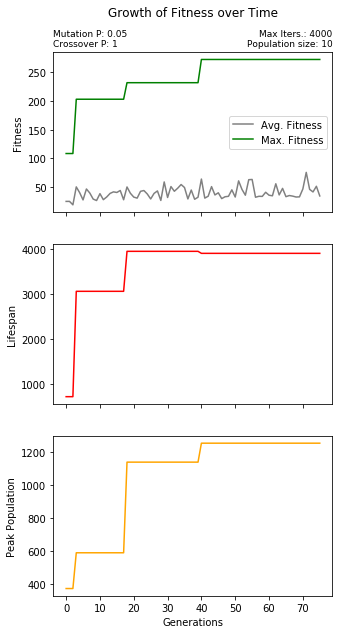

In [13]:
import matplotlib
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 6))

f, axs = plt.subplots(3, 1, sharex = True, sharey = False)
f.set_size_inches(5, 10)

axs[0].plot(fit_rise, c="gray", label="Avg. Fitness")
axs[1].plot(l_g, c="red", label="Lifespan")
axs[2].plot(p_g, c="orange", label="Peak")
axs[0].plot(fit_max_rise, c="green", label = "Max. Fitness")
axs[0].set_title("Growth of Fitness over Time\n\n")
axs[0].set_title("Max Iters.: "+str(In)+"\nPopulation size: "+str(len(new_pop.members)),loc="right",fontdict = {'fontsize': 9})
axs[0].set_title("Mutation P: "+str(Pm)+"\nCrossover P: "+str(Pr),loc="left",fontdict = {'fontsize': 9})

axs[2].set_xlabel("Generations")
axs[0].set_ylabel("Fitness")
axs[1].set_ylabel("Lifespan")
axs[2].set_ylabel("Peak Population")
axs[0].legend()
plt.show()
